Dataset link: https://www.kaggle.com/datasets/suraj520/agricultural-data-for-rajasthan-india-2018-2019/data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
crop_production_df = pd.read_csv('crop_production_data.csv')
water_usage_df = pd.read_csv('water_usage_data.csv')
soil_analysis_df = pd.read_csv('soil_analysis_data.csv')
crop_price_df = pd.read_csv('crop_price_data.csv')

In [3]:
crop_production_df.head()

,District,Crop,Season,Area (hectares),Yield (quintals),Production (metric tons)
0,Jodhpur,Wheat,Kharif,16490.142459,30.691986,5061.152230
1,Kota,Gram,Rabi,16943.065614,45.818232,7763.013072
2,Jaipur,Wheat,Rabi,14297.539876,29.752629,4253.893981
3,Hanumangarh,Coriander,Rabi,19737.638447,42.026511,8295.040749
4,Hanumangarh,Citrus,Rabi,13591.576842,38.195933,5191.429648


In [4]:
water_usage_df.head()

,District,Crop,Irrigation Method,Water Consumption (liters/hectare),Water Availability (liters/hectare)
0,Udaipur,Garlic,Tube Well,11609.330886,11335.919980
1,Bhilwara,Gram,Drip Irrigation,12648.406038,12091.900254
2,Udaipur,Guava,Canal Irrigation,10063.162448,9810.943169
3,Jodhpur,Barley,Sprinkler Irrigation,10110.539993,10754.217313
4,Alwar,Gram,Canal Irrigation,9320.451018,8695.537819


In [5]:
soil_analysis_df.head()

,District,Soil Type,pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha)
0,Jaipur,Chalky (Calcareous),6.546096,1.569807,27.931972,29.438438,42.782766
1,Bhilwara,Nitrogenous,6.832259,2.243018,22.263480,25.413455,37.644377
2,Jodhpur,Sandy,7.453182,2.662898,23.564182,13.014409,37.082003
3,Jaipur,Clay,8.019189,1.240327,15.839222,17.744206,42.758704
4,Jaipur,Sandy,8.100131,1.768419,27.942867,25.769504,30.651292


In [6]:
crop_price_df.head()

,District,Crop,Market,Date,Price (INR/quintal)
0,Alwar,Barley,Alwar APMC Mandi,2018-09-05,2490.092421
1,Sri Ganganagar,Pomegranate,Padampur Mandi,2018-11-20,2348.904922
2,Kota,Maize,Ramganj Mandi,2018-04-06,2448.287513
3,Nagaur,Fenugreek,Didwana Mandi,2018-09-26,2714.419518
4,Nagaur,Gram,Didwana Mandi,2018-10-06,2883.356997


In [7]:
merged_df_1 = pd.merge(crop_production_df, water_usage_df, on=["District", "Crop"], how="inner")
merged_df_2 = pd.merge(merged_df_1, soil_analysis_df, on="District", how="inner")
merged_final = pd.merge(merged_df_2, crop_price_df, on=["District", "Crop"], how="inner")

In [8]:
merged_df = merged_final.sample(frac=0.005, random_state=42)

In [9]:
merged_df.shape

(45276, 18)

In [10]:
merged_df.head()

,District,Crop,Season,Area (hectares),Yield (quintals),Production (metric tons),Irrigation Method,Water Consumption (liters/hectare),Water Availability (liters/hectare),Soil Type,pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha),Market,Date,Price (INR/quintal)
8778405,Jaipur,Wheat,Rabi,16131.301182,41.462190,6688.390676,Canal Irrigation,16092.813681,15806.901430,Black lava soil,6.839961,1.880624,36.427911,19.714694,40.707979,Bassi Mandi,2018-04-13,3070.194713
2024649,Ajmer,Citrus,Rabi,16842.500100,35.450730,5970.789237,Tube Well,9142.721450,8469.260440,Nitrogenous,7.923385,0.936386,29.504528,16.985897,42.161315,Kishangarh Mandi,2018-04-09,2553.372517
4890792,Jaipur,Mustard,Kharif,14427.952798,26.354204,3802.372181,Tube Well,12358.597811,12684.561083,Nitrogenous,8.604928,2.163497,25.824377,28.264565,50.388888,Kisan Mandi,2018-10-10,2192.574775
3096810,Nagaur,Barley,Kharif,15633.052402,37.318974,5834.094766,Drip Irrigation,7608.361869,7927.147091,Black lava soil,7.424840,1.836652,24.787112,14.138831,42.321849,Didwana Mandi,2018-08-23,2444.069075
4968612,Bhilwara,Fenugreek,Kharif,19900.294597,33.908028,6747.797390,Drip Irrigation,8744.458063,8454.102753,Alkaline,7.524664,2.361223,28.173596,31.939839,40.900355,Bhilwara APMC Mandi,2019-03-29,1781.175314


In [11]:
merged_df.dtypes

District                                object
Crop                                    object
Season                                  object
Area (hectares)                        float64
Yield (quintals)                       float64
Production (metric tons)               float64
Irrigation Method                       object
Water Consumption (liters/hectare)     float64
Water Availability (liters/hectare)    float64
Soil Type                               object
pH Level                               float64
Organic Matter (%)                     float64
Nitrogen Content (kg/ha)               float64
Phosphorus Content (kg/ha)             float64
Potassium Content (kg/ha)              float64
Market                                  object
Date                                    object
Price (INR/quintal)                    float64
dtype: object

In [12]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45276 entries, 8778405 to 2833973
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   District                             45276 non-null  object 
 1   Crop                                 45276 non-null  object 
 2   Season                               45276 non-null  object 
 3   Area (hectares)                      45276 non-null  float64
 4   Yield (quintals)                     45276 non-null  float64
 5   Production (metric tons)             45276 non-null  float64
 6   Irrigation Method                    45276 non-null  object 
 7   Water Consumption (liters/hectare)   45276 non-null  float64
 8   Water Availability (liters/hectare)  45276 non-null  float64
 9   Soil Type                            45276 non-null  object 
 10  pH Level                             45276 non-null  float64
 11  Organic Matter (%)       

In [13]:
merged_df.describe()

,Area (hectares),Yield (quintals),Production (metric tons),Water Consumption (liters/hectare),Water Availability (liters/hectare),pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha),Price (INR/quintal)
count,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000
mean,15078.295061,37.667273,5681.186922,10526.002336,10510.275546,7.496725,1.993106,29.876325,19.701074,39.915914,2500.689589
std,2784.051261,8.280651,1644.649387,2854.443127,2929.825286,0.520090,0.520536,5.228062,5.055133,4.841452,296.431514
min,5276.197980,20.272936,1728.445956,4673.530139,4505.257189,5.889492,0.155817,11.994574,4.961838,24.116481,1323.279925
25%,13165.446591,30.999720,4491.574907,8172.130834,8133.959009,7.156975,1.631485,26.190877,16.201484,36.721561,2303.189573
50%,15178.891110,37.193350,5570.334123,10303.143064,10417.701688,7.506250,1.977863,29.818347,19.900408,39.804902,2499.817455
75%,16988.643806,44.016968,6778.919195,12716.654361,12926.585227,7.853516,2.351746,33.297256,23.039202,43.422252,2701.827036
max,20000.000000,60.429192,10834.530834,18631.091327,18489.171266,9.038430,3.764528,45.760284,35.588406,54.678290,3513.330472


In [14]:
merged_df.duplicated().sum()

0

In [15]:
# Check for missing values in each column
missing_values = merged_df.isnull().sum()
print(missing_values)

District                               0
Crop                                   0
Season                                 0
Area (hectares)                        0
Yield (quintals)                       0
Production (metric tons)               0
Irrigation Method                      0
Water Consumption (liters/hectare)     0
Water Availability (liters/hectare)    0
Soil Type                              0
pH Level                               0
Organic Matter (%)                     0
Nitrogen Content (kg/ha)               0
Phosphorus Content (kg/ha)             0
Potassium Content (kg/ha)              0
Market                                 0
Date                                   0
Price (INR/quintal)                    0
dtype: int64


In [16]:
# Converting an object type representing a date to a datetime type so that we can perform arthematic operations on days,weeks,years and extract info about months,dates etc
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
print(merged_df['Date'])

8778405   2018-04-13
2024649   2018-04-09
4890792   2018-10-10
3096810   2018-08-23
4968612   2019-03-29
             ...    
1796494   2019-03-13
5872836   2019-03-01
1601828   2018-05-28
6508988   2018-08-01
2833973   2018-06-24
Name: Date, Length: 45276, dtype: datetime64[ns]


In [17]:
# verifying if Date column is of type DateTime
merged_df.dtypes

District                                       object
Crop                                           object
Season                                         object
Area (hectares)                               float64
Yield (quintals)                              float64
Production (metric tons)                      float64
Irrigation Method                              object
Water Consumption (liters/hectare)            float64
Water Availability (liters/hectare)           float64
Soil Type                                      object
pH Level                                      float64
Organic Matter (%)                            float64
Nitrogen Content (kg/ha)                      float64
Phosphorus Content (kg/ha)                    float64
Potassium Content (kg/ha)                     float64
Market                                         object
Date                                   datetime64[ns]
Price (INR/quintal)                           float64
dtype: object

In [18]:
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
merged_df['Day_of_Year'] = merged_df['Date'].dt.dayofyear
merged_df = merged_df.drop(columns=['Date'])

In [19]:
print(merged_df.columns)

Index(['District', 'Crop', 'Season', 'Area (hectares)', 'Yield (quintals)',
       'Production (metric tons)', 'Irrigation Method',
       'Water Consumption (liters/hectare)',
       'Water Availability (liters/hectare)', 'Soil Type', 'pH Level',
       'Organic Matter (%)', 'Nitrogen Content (kg/ha)',
       'Phosphorus Content (kg/ha)', 'Potassium Content (kg/ha)', 'Market',
       'Price (INR/quintal)', 'Day_of_Year'],
      dtype='object')


In [20]:
# standardising numerical values

from sklearn.preprocessing import MinMaxScaler

# Selecting the numerical columns
numerical_columns = [
    'Area (hectares)',
    'Yield (quintals)',
    'Production (metric tons)',
    'Water Consumption (liters/hectare)',
    'Water Availability (liters/hectare)',
    'pH Level',
    'Organic Matter (%)',
    'Nitrogen Content (kg/ha)',
    'Phosphorus Content (kg/ha)',
    'Potassium Content (kg/ha)',
    'Price (INR/quintal)',
    'Day_of_Year'
]

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply the scaler to the numerical columns
merged_df[numerical_columns] = scaler.fit_transform(merged_df[numerical_columns])


In [21]:
merged_df.head()

,District,Crop,Season,Area (hectares),Yield (quintals),Production (metric tons),Irrigation Method,Water Consumption (liters/hectare),Water Availability (liters/hectare),Soil Type,pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha),Market,Price (INR/quintal),Day_of_Year
8778405,Jaipur,Wheat,Rabi,0.737249,0.527670,0.544685,Canal Irrigation,0.818143,0.808189,Black lava soil,0.301838,0.477956,0.723614,0.481701,0.542883,Bassi Mandi,0.797660,0.280220
2024649,Ajmer,Citrus,Rabi,0.785551,0.377968,0.465880,Tube Well,0.320199,0.283469,Nitrogenous,0.645898,0.216301,0.518572,0.392602,0.590437,Kishangarh Mandi,0.561673,0.269231
4890792,Jaipur,Mustard,Kharif,0.621562,0.151440,0.227752,Tube Well,0.550602,0.584908,Nitrogenous,0.862334,0.556343,0.409581,0.760866,0.859648,Kisan Mandi,0.396929,0.774725
3096810,Nagaur,Barley,Kharif,0.703409,0.424493,0.450869,Drip Irrigation,0.210268,0.244702,Black lava soil,0.487576,0.465772,0.378862,0.299642,0.595690,Didwana Mandi,0.511764,0.642857
4968612,Bhilwara,Fenugreek,Kharif,0.993228,0.339551,0.551209,Drip Irrigation,0.291665,0.282385,Alkaline,0.519277,0.611134,0.479155,0.880869,0.549178,Bhilwara APMC Mandi,0.209080,0.239011


In [22]:
print(merged_df.columns)


Index(['District', 'Crop', 'Season', 'Area (hectares)', 'Yield (quintals)',
       'Production (metric tons)', 'Irrigation Method',
       'Water Consumption (liters/hectare)',
       'Water Availability (liters/hectare)', 'Soil Type', 'pH Level',
       'Organic Matter (%)', 'Nitrogen Content (kg/ha)',
       'Phosphorus Content (kg/ha)', 'Potassium Content (kg/ha)', 'Market',
       'Price (INR/quintal)', 'Day_of_Year'],
      dtype='object')


**The pandas-profiling library, named "ydata-profiling", is a Python library which is designed to automate the process of Exploratory Data Analysis (EDA). It generates a comprehensive and interactive report that provides a detailed overview of a dataset, making it easier to understand the data's structure, contents, and potential issues without writing extensive code.**

In [23]:
!pip install ydata-profiling

In [24]:
!pip install --upgrade bottleneck

In [25]:
from ydata_profiling import ProfileReport

In [26]:
profile = ProfileReport(merged_df, title="Merged DataFrame Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
print(merged_df['District'].unique())

['Jaipur' 'Ajmer' 'Nagaur' 'Bhilwara' 'Kota' 'Alwar' 'Jodhpur' 'Udaipur'
 'Sri Ganganagar' 'Hanumangarh']


In [28]:
print(merged_df['Crop'].unique())

['Wheat' 'Citrus' 'Mustard' 'Barley' 'Fenugreek' 'Onion' 'Chilli' 'Garlic'
 'Tomato' 'Gram' 'Sugarcane' 'Oilseeds' 'Cumin' 'Mango' 'Pulses' 'Maize'
 'Fennel' 'Pomegranate' 'Opium' 'Cotton' 'Coriander' 'Guava' 'Bajra']


In [29]:
print(merged_df['Season'].unique())

['Rabi' 'Kharif']


In [30]:
print(merged_df['Irrigation Method'].unique())

['Canal Irrigation' 'Tube Well' 'Drip Irrigation' 'Sprinkler Irrigation']


In [31]:
print(merged_df['Soil Type'].unique())

['Black lava soil' 'Nitrogenous' 'Alkaline' 'Saline' 'Chalky (Calcareous)'
 'Loamy' 'Sandy' 'Clay']


In [32]:
print(merged_df['Market'].unique())

['Bassi Mandi' 'Kishangarh Mandi' 'Kisan Mandi' 'Didwana Mandi'
 'Bhilwara APMC Mandi' 'Mandal Mandi' 'Kota APMC Mandi' 'Alwar APMC Mandi'
 'Jodhpur APMC Mandi' 'Tijara Mandi' 'Sanganer Mandi' 'Udaipur APMC Mandi'
 'Fatehnagar Mandi' 'Ajmer APMC Mandi' 'Ramganj Mandi' 'Chandpole Mandi'
 'Padampur Mandi' 'Sojati Gate Mandi' 'Sri Ganganagar APMC Mandi'
 'Kukas Mandi' 'Pilibanga Mandi' 'Nagaur APMC Mandi' 'Muhana Mandi'
 'Hanumangarh APMC Mandi']


In [33]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

categorical_columns = ['District', 'Crop', 'Season', 'Irrigation Method', 'Soil Type', 'Market']

label_encoders = {}
mappings = {}

for col in categorical_columns:
    le = LabelEncoder()
    merged_df[col] = le.fit_transform(merged_df[col])
    label_encoders[col] = le
    mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))

for col, mapping in mappings.items():
    print(f"Mapping for {col}:")
    for category, encoded_value in mapping.items():
        print(f"  {category}: {encoded_value}")
    print()

Mapping for District:
  Ajmer: 0
  Alwar: 1
  Bhilwara: 2
  Hanumangarh: 3
  Jaipur: 4
  Jodhpur: 5
  Kota: 6
  Nagaur: 7
  Sri Ganganagar: 8
  Udaipur: 9

Mapping for Crop:
  Bajra: 0
  Barley: 1
  Chilli: 2
  Citrus: 3
  Coriander: 4
  Cotton: 5
  Cumin: 6
  Fennel: 7
  Fenugreek: 8
  Garlic: 9
  Gram: 10
  Guava: 11
  Maize: 12
  Mango: 13
  Mustard: 14
  Oilseeds: 15
  Onion: 16
  Opium: 17
  Pomegranate: 18
  Pulses: 19
  Sugarcane: 20
  Tomato: 21
  Wheat: 22

Mapping for Season:
  Kharif: 0
  Rabi: 1

Mapping for Irrigation Method:
  Canal Irrigation: 0
  Drip Irrigation: 1
  Sprinkler Irrigation: 2
  Tube Well: 3

Mapping for Soil Type:
  Alkaline: 0
  Black lava soil: 1
  Chalky (Calcareous): 2
  Clay: 3
  Loamy: 4
  Nitrogenous: 5
  Saline: 6
  Sandy: 7

Mapping for Market:
  Ajmer APMC Mandi: 0
  Alwar APMC Mandi: 1
  Bassi Mandi: 2
  Bhilwara APMC Mandi: 3
  Chandpole Mandi: 4
  Didwana Mandi: 5
  Fatehnagar Mandi: 6
  Hanumangarh APMC Mandi: 7
  Jodhpur APMC Mandi: 8
  Kis

In [34]:
# check whether all categorical data is label encoded
print(merged_df['Market'].unique())
print(merged_df['Soil Type'].unique())
print(merged_df['Irrigation Method'].unique())
print(merged_df['Season'].unique())
print(merged_df['Crop'].unique())
print(merged_df['District'].unique())

[ 2 10  9  5  3 13 11  1  8 22 19 23  6  0 18  4 16 20 21 12 17 15 14  7]
[1 5 0 6 2 4 7 3]
[0 3 1 2]
[1 0]
[22  3 14  1  8 16  2  9 21 10 20 15  6 13 19 12  7 18 17  5  4 11  0]
[4 0 7 2 6 1 5 9 8 3]


In [35]:
merged_df.shape

(45276, 18)

In [36]:
print(merged_df.columns)

Index(['District', 'Crop', 'Season', 'Area (hectares)', 'Yield (quintals)',
       'Production (metric tons)', 'Irrigation Method',
       'Water Consumption (liters/hectare)',
       'Water Availability (liters/hectare)', 'Soil Type', 'pH Level',
       'Organic Matter (%)', 'Nitrogen Content (kg/ha)',
       'Phosphorus Content (kg/ha)', 'Potassium Content (kg/ha)', 'Market',
       'Price (INR/quintal)', 'Day_of_Year'],
      dtype='object')


# Spliting the Data into Training and Testing Sets (80:20)

In [37]:
from sklearn.model_selection import train_test_split

In [38]:
# x is input
x = merged_df.drop(columns=['Price (INR/quintal)'])
# y is output
y = merged_df['Price (INR/quintal)']

In [39]:
merged_df.shape

(45276, 18)

In [40]:
# x_train and y_train are the training data
# x_test and y_test are the testing data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [41]:
print("x_train shape is: ", x_train.shape)
print("y_train shape is: ",y_train.shape)
print("x_test shape is: ",x_test.shape)
print("y_test shape is: ",y_test.shape)

x_train shape is:  (36220, 17)
y_train shape is:  (36220,)
x_test shape is:  (9056, 17)
y_test shape is:  (9056,)



# Feature Selection with Random Forest



In [42]:
from sklearn.ensemble import RandomForestRegressor

In [43]:
# Initialize the RandomForestRegressor model
model = RandomForestRegressor(random_state=42)

In [44]:
# Fit the model to the training data
model.fit(x_train, y_train)

RandomForestRegressor(random_state=42)

In [45]:
# Get feature importances from the trained model
importances = model.feature_importances_

In [46]:
# Create a DataFrame to display the features and their importance scores
feature_importances = pd.DataFrame({'Feature': x_train.columns, 'Importance': importances})

In [47]:
# Sort the features by their importance score in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

In [48]:
# Set a threshold for feature importance
threshold = 0.05  # Example threshold, you can adjust this value

In [49]:
# Select features with importance above the threshold
selected_features = feature_importances[feature_importances['Importance'] > threshold]['Feature']

In [50]:
print(f"Selected features with importance above {threshold}:")
print(selected_features)

Selected features with importance above 0.05:
16    Day_of_Year
1            Crop
15         Market
0        District
Name: Feature, dtype: object


In [51]:
# Select only the features that meet the threshold from the training and testing datasets
x_train_selected = x_train[selected_features]
x_test_selected = x_test[selected_features]

# ***Applying Models***

In [52]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

# 1.  XGBoost Regressor

In [53]:
!pip install xgboost

In [54]:
from xgboost import XGBRegressor

In [55]:
param_grid = {
    'n_estimators': [1500, 1700],  # Number of trees
    'learning_rate': [0.01, 0.02],  # Lower learning rate for more precise boosting
    'max_depth': [12,13]  # Deeper trees to capture more complex patterns
}

In [56]:
# Initialize the XGBRegressor
model = XGBRegressor(random_state=42)

In [57]:
# Initialize GridSearchCV with the model and parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='r2')

In [58]:
# Fit the GridSearchCV to the training data
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.02], 'max_depth': [12, 13],
                         'n_estimators': [1500, 1700]},
             scoring='r2', verbose=2)

In [59]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.00040222944750067523
Test Set R-squared: 0.9777227672739016


# 2. Light Gradient Boosting Machine Regressor

In [60]:
!pip install lightgbm

In [61]:
!pip install --upgrade pandas
!pip install --upgrade dask

     ---------------------------------------- 11.6/11.6 MB 2.0 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\nisht\\anaconda3\\Lib\\site-packages\\~andas.libs\\msvcp140-ef6047a69b174ada5cb2eff1d2bc9a62.dll'
Consider using the `--user` option or check the permissions.



     ---------------------------------------- 1.3/1.3 MB 1.6 MB/s eta 0:00:00
  Attempting uninstall: dask
    Found existing installation: dask 2024.8.2
    Uninstalling dask-2024.8.2:
      Successfully uninstalled dask-2024.8.2


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
distributed 2022.7.0 requires dask==2022.7.0, but you have dask 2024.11.2 which is incompatible.


In [62]:
import lightgbm as lgb

In [63]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [1000, 1500],  # Number of boosting iterations
    'learning_rate': [0.01, 0.05],  # Learning rate
    'max_depth': [10, 15],  # Maximum depth of trees
    'num_leaves': [50, 100],  # Number of leaves in one tree
}

In [64]:
# Initialize the LightGBM Regressor
model = lgb.LGBMRegressor(random_state=42)

In [65]:
# Initialize GridSearchCV with the model and parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='r2')

In [66]:
# fitting model
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 36220, number of used features: 4
[LightGBM] [Info] Start training from score 0.537426


GridSearchCV(cv=3, estimator=LGBMRegressor(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05], 'max_depth': [10, 15],
                         'n_estimators': [1000, 1500],
                         'num_leaves': [50, 100]},
             scoring='r2', verbose=2)

In [67]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.001028936642999232
Test Set R-squared: 0.9430129713303355


# 3. Gradient Boosting Regressor


In [68]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

In [69]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [900, 1000],  # Number of trees
    'learning_rate': [0.01, 0.02],  # Learning rate
    'max_depth': [15, 20]  # Depth of each tree
}

In [70]:
# Initialize the GradientBoostingRegressor
model = GradientBoostingRegressor(random_state=42)

In [71]:
# Initialize GridSearchCV with the model and parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=3, scoring='r2')


In [77]:
# Fit the GridSearchCV to the training data
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3, estimator=GradientBoostingRegressor(random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.02], 'max_depth': [15, 20],
                         'n_estimators': [900, 1000]},
             scoring='r2', verbose=3)

In [78]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.0003002580922278952
Test Set R-squared: 0.9833703886176959


# Visualization of results

In [79]:
%matplotlib inline

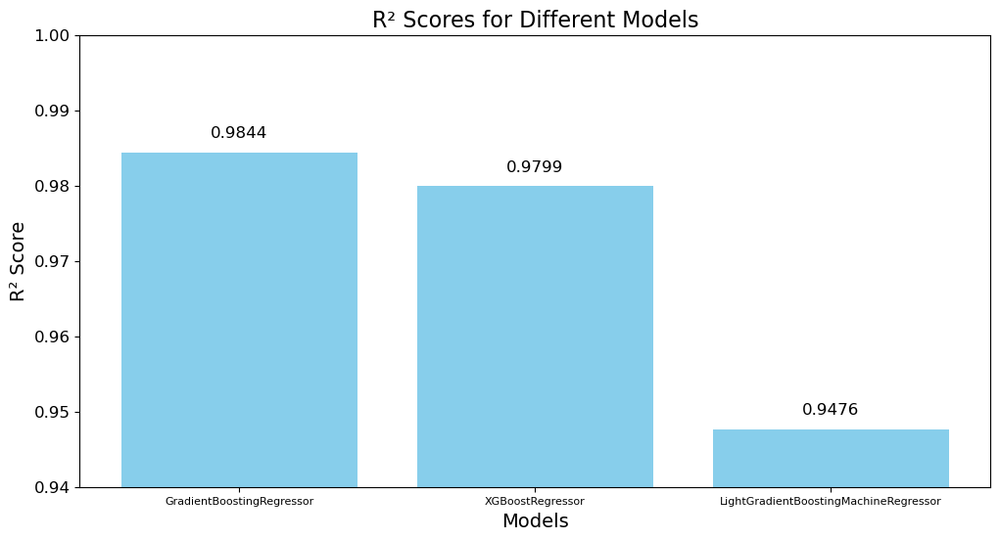

In [80]:
models = ['GradientBoostingRegressor', 'XGBoostRegressor', 'LightGradientBoostingMachineRegressor']
r2_scores = [0.9844, 0.9799, 0.9476]  # R² scores

plt.figure(figsize=(12, 6))
bars = plt.bar(models, r2_scores, color='skyblue')
plt.title('R² Scores for Different Models', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('R² Score', fontsize=14)
plt.ylim(0.94, 1)  

plt.xticks(fontsize=8, rotation=0, ha='center')
plt.yticks(fontsize=12)

# Adding the value on top of the bars with four decimal places
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.4f}", ha='center', fontsize=12)

plt.show()

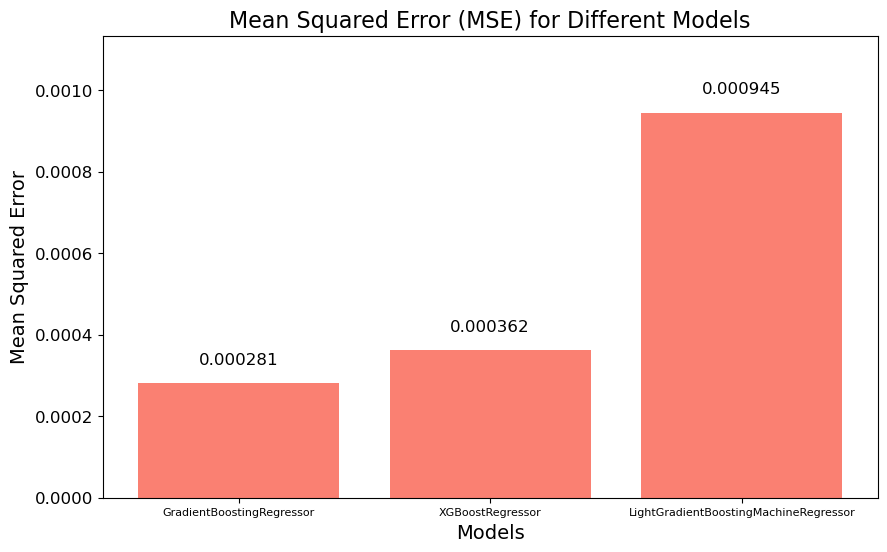

In [81]:
models = ['GradientBoostingRegressor', 'XGBoostRegressor', 'LightGradientBoostingMachineRegressor']
mse_values = [0.000281, 0.000362, 0.000945]  # MSE values

# Plotting Mean Squared Error (MSE)
plt.figure(figsize=(10, 6))
bars = plt.bar(models, mse_values, color='salmon')
plt.title('Mean Squared Error (MSE) for Different Models', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('Mean Squared Error', fontsize=14)
plt.xticks(fontsize=8)
plt.yticks(fontsize=12)
plt.ylim(0, max(mse_values) + max(mse_values) * 0.2)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + max(mse_values) * 0.05, f"{yval:.6f}", ha='center', fontsize=12)

plt.show()